# Grain Size Distribution - Height Correlation Function

Find relevant parameters to describe the topography of sputtered Ruthenium thin films on Si substrate

SEM images do not contain the height information, however they do provide informations regarding grain size distribution.

In [1]:
from skimage import data, io, util, segmentation, color, draw, filters
import numpy as np
from scipy import ndimage
%matplotlib nbagg
import matplotlib
from matplotlib import cm
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
from PIL import Image
import os 
import sys
import cv2
import pytesseract

debug = True #or 'False' when you do not want to debug

path = "/Users/sfiligoj/Desktop/low_SSP"
os.chdir(path)
filess= os.listdir()
# filess = ['high_700C_089.tif','high_250C_009.tif']
filess = [f for f in filess if f.endswith('tif')]

In [ ]:
for i, file in enumerate(filess):
    
#     #choose one single temperature:
#     if '700C'in file:
#         temperature = file[5:9]
#         density = 'High'
#     else:
#          continue
        
#     if 'high' in file:
#         density = 'High'
#         if 'asdep' in file:
#             temperature = 'as-deposited'
#         else:
#             temperature = file[5:9]
    if 'low' in file:
        density = 'Low' 
        if 'asdep' in file:
            temperature = 'as-deposited'
        else:
            temperature = file[4:8]
#     if 'LH' in file:
#         density = 'Low-to-High' 
#         if 'asdep' in file:
#             temperature = 'as-deposited'
#         else:
#             temperature = file[3:7]
    if '*' in file:
        continue 
  
    
    img = io.imread(file, as_gray=True) # .png number of channels = 4 : ( R G B alpha ) , alpha: transparency
    plt.imshow(img)
    plt.show()
    
    print(f'running file {file}')

In [2]:
# blueprint `filename = fov`
# FOV_dict = {    
#     'high_700C_089.tif': 8290,
#     'high_700C_088.tif': 2070,
#     'high_700C_086.tif': 1380,
#     'high_700C_087.tif': 2070,
# }
with open('FOVs.json', 'r') as f:
    FOV_dict = json.loads(f.read())

running file *low_800C_25000x_010_40min.tif
running file *low_700C_100.tif
running file low_800_150000x_043.tif
FOV of low_800_150000x_043.tif: 1380
correlation length X = 36.39, Y = 33.69


/anaconda3/envs/pina/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/anaconda3/envs/pina/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


<IPython.core.display.Javascript object>


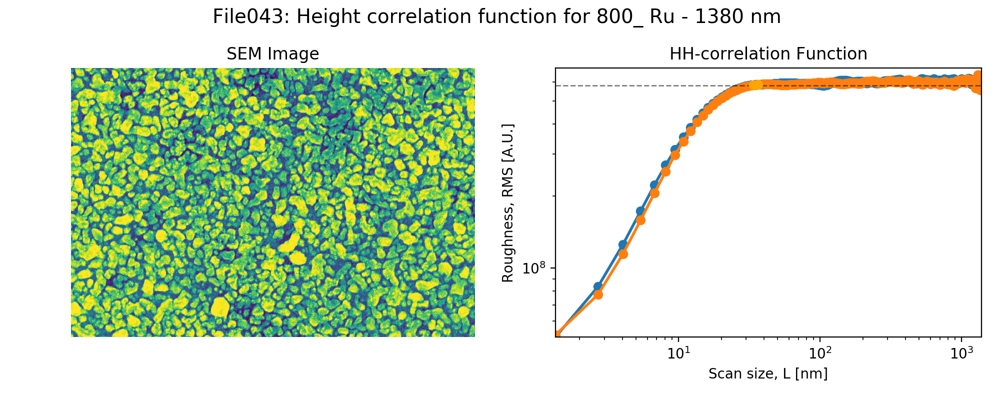

running file low_600C_098.tif
FOV of low_600C_098.tif: 2070
correlation length X = 12.13, Y = 8.086


<IPython.core.display.Javascript object>


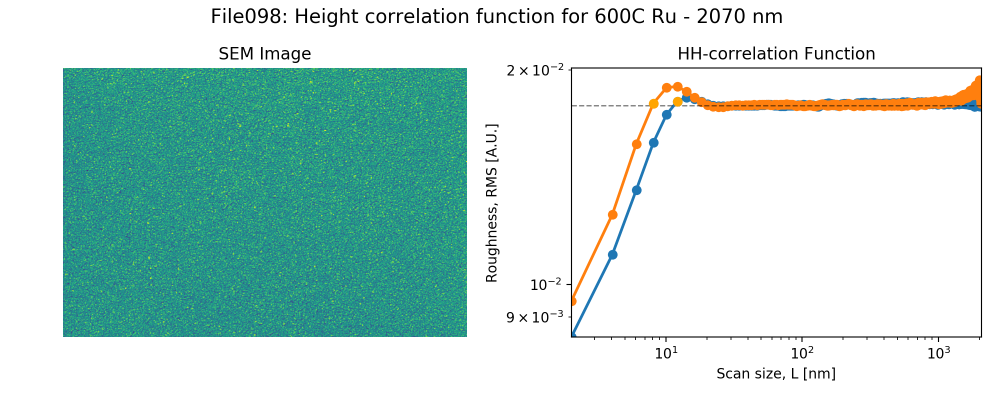

running file *low_700C_099.tif
running file low_700C_090.tif
FOV of low_700C_090.tif: 2070
correlation length X = 8.086, Y = 8.086


<IPython.core.display.Javascript object>


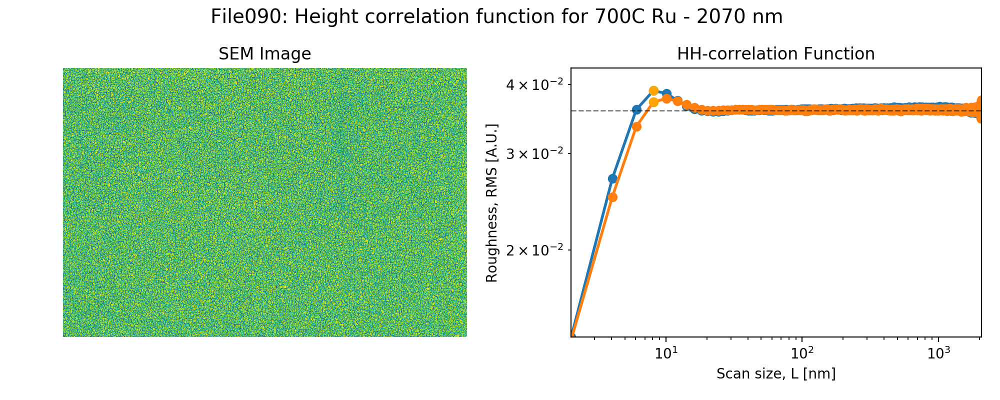

running file low_700C_108.tif
FOV of low_700C_108.tif: 1380
correlation length X = 181.9, Y = 13.48


<IPython.core.display.Javascript object>


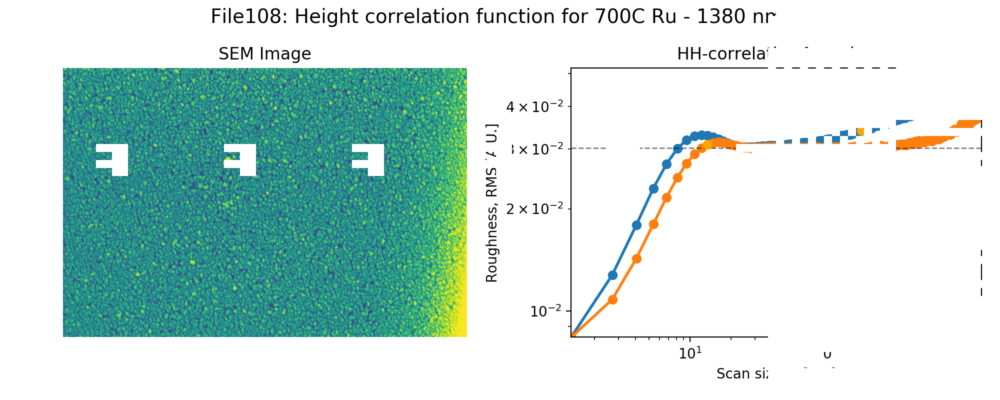

running file low_800C_20000x_044.tif
FOV of low_800C_20000x_044.tif: 10400
correlation length X = 670.3, Y = 467.2


<IPython.core.display.Javascript object>


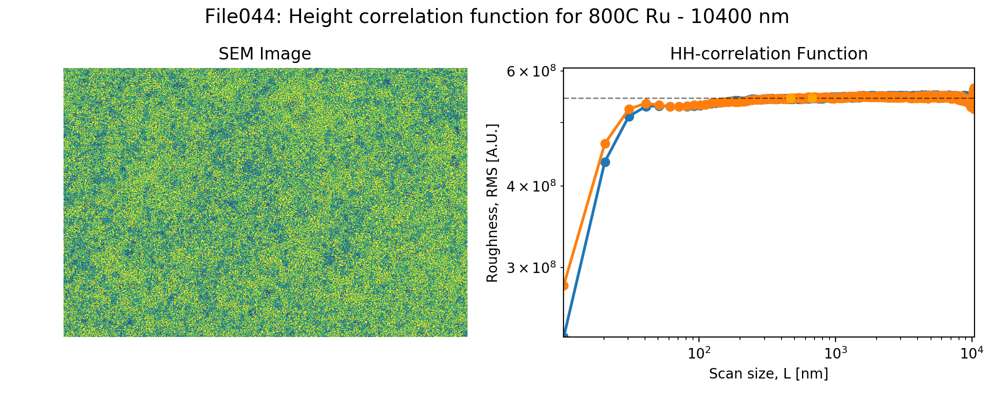

running file low_700C_109.tif
FOV of low_700C_109.tif: 8290
correlation length X = 793.4, Y = 1.287e+03


<IPython.core.display.Javascript object>


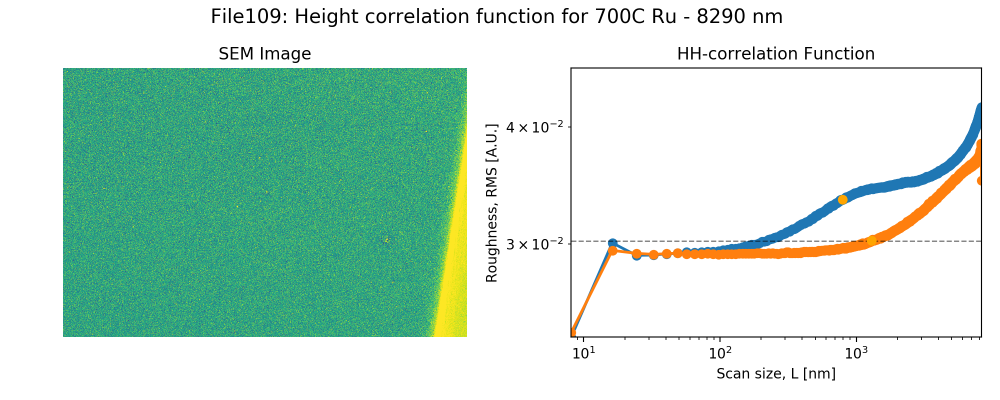

running file low_800C_20000x_2kV_044.tif
FOV of low_800C_20000x_2kV_044.tif: 10400
correlation length X = 396.1, Y = 548.4


<IPython.core.display.Javascript object>


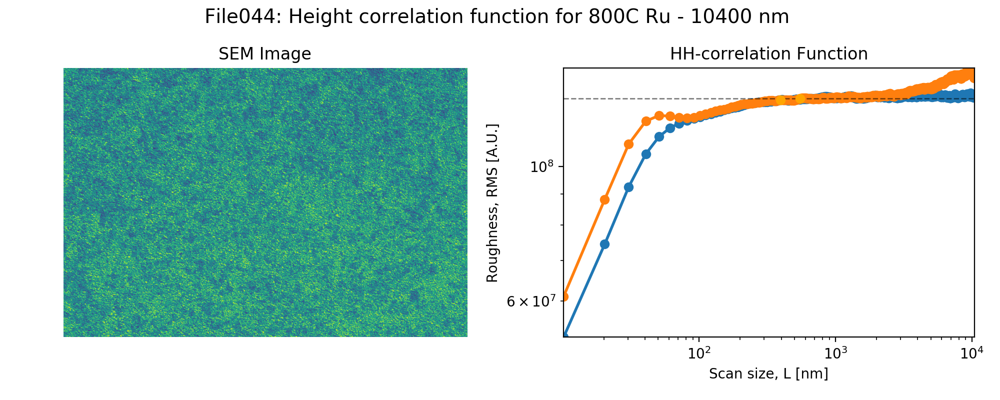

In [4]:
for i, file in enumerate(filess[:10]):
    
    print(f'running file {file}')
    img = io.imread(file, as_gray=True)
    
#     #choose one single temperature:
#     if '700C'in file:
#         temperature = file[5:9]
#         density = 'High'
#     else:
#          continue
        
#     if 'high' in file:
#         density = 'High'
#         if 'asdep' in file:
#             temperature = 'as-deposited'
#         else:
#             temperature = file[5:9]
    if 'low' in file:
        density = 'Low' 
        if 'asdep' in file:
            temperature = 'as-deposited'
        else:
            temperature = file[4:8]
#     if 'LH' in file:
#         density = 'Low-to-High' 
#         if 'asdep' in file:
#             temperature = 'as-deposited'
#         else:
#             temperature = file[3:7]

    if '*' in file:
        continue 
        
    
    
    ScanSize = FOV_dict[file]
    if debug: print(f"FOV of {file}: {ScanSize}")
        
       #     if debug: print(f'Reading in {filess}, with shape {img.shape}')
    img = np.copy(img[:1024,:])
    
    N_Pixel = img.shape[0]                              # before was len(data), which works in this case, but it would be the N of rows 
    
    StepSize = ScanSize/N_Pixel                          # nm/px
    Xdelta = np.linspace(StepSize, ScanSize, num=N_Pixel)
        
    HHcorr_x = np.zeros(N_Pixel, dtype='float')
#     HHcorr_y = np.zeros(N_Pixel, dtype='float')
    for px_dist in range(N_Pixel):
        shifted_img = img[:, px_dist+1:].astype(float)
        img_section = img[:, : -px_dist-1].astype(float)
        HHcorr_x[px_dist] = np.mean((img_section-shifted_img)**2)
#     for px_dist in range(N_Pixel):
#         shifted_img = img[px_dist+1:,:].astype(float)
#         img_section = img[:-px_dist-1,:].astype(float)
#         HHcorr_y[px_dist] = np.mean((img_section-shifted_img)**2)    

    if 'asdep' in file:
        limit1 = np.mean(HHcorr_x[:150])
    else:
        limit1 = np.mean(HHcorr_x[:300])
#     if 'asdep' in file:
#         limit2 = np.mean(HHcorr_y[:150])
#     else:
#         limit2 = np.mean(HHcorr_y[:300])
    
#     print(f'limit={limit2}')

    for j in range(len(Xdelta)):
            if HHcorr_x[j]>limit1:
                corrlength_x = Xdelta[j] 
                corrvalue_x = HHcorr_x[j]
                # print(f'XDelta={Xdelta[j]},{j}')
                break
                
#     for j in range(len(Xdelta)):
#             if HHcorr_y[j]>limit2:
#                 corrlength_y = Xdelta[j] 
#                 corrvalue_y = HHcorr_y[j]
#                 # print(f'XDelta={Xdelta[j]},{j}')
#                 break
    
    print(f'correlation length X = {corrlength_x:.4}') #, Y = {corrlength_y:.4}')


    # ***    Plot what you got   ***   

    #For all the beautiful colors go to   http://colorbrewer2.org/#type=qualitative&scheme=Paired&n=4
    #                                   &  https://www.quackit.com/css/css_color_codes.cfm

    #to have different subplots add:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (10,4))
    ax = np.ravel(ax)

    ax[0].imshow(img, cmap='viridis')
    ax[0].axis('off')
    ax[0].set_title(f"SEM Image")
    
    # plot the data
    ax[1].scatter(corrlength_x, corrvalue_x, marker='o', color='orange', zorder=10)
    ax[1].scatter(corrlength_y, corrvalue_y, marker='o', color='orange', zorder=10)

    ax[1].loglog(Xdelta, HHcorr_x, label = 'HH corr', linewidth = 2, alpha=1, marker ='o',zorder=1)
    ax[1].loglog(Xdelta, HHcorr_y, label = 'HH corr', linewidth = 2, alpha=1, marker ='o',zorder=1)
            #and its errors:
            #plt.errorbar(Xdelta, HHcorr, yerr=e, fmt=".")

    ax[1].axhline(y=limit2, linestyle="dashed",linewidth = 1, color = 'black', zorder =5, alpha =0.5)


    ax[1].set(ylabel='Roughness, RMS [A.U.]')
    ax[1].set(xlabel='Scan size, L [nm]')
    ax[1].set_title(f"HH-correlation Function")  
    
    ax[1].set_xlim(Xdelta[0], ScanSize)
    ax[1].set_ylim(HHcorr_x[0], max(HHcorr_x)*1.1)
        
    fig.tight_layout()
    
    sup_title = f"File{file[-7:-4]}: Height correlation function for {temperature} Ru - {ScanSize} nm "
    fig.suptitle(sup_title, fontsize=14)
    fig.subplots_adjust(top=0.83)
  
    figname = f"{sup_title}.png"
    
#     fig.savefig(f'HH function for {temperature} {density} density Ru - {file[-7:-4]}.png', dpi=600)
        
#     text = open(f"Values for {temperature} {density} density Ruthenium.txt","a")
#     text.write(f'\n Filename = {file} \n ScanSize = {ScanSize} nm \n Correlation length = {corrlength:.3} nm \n')
#     text.close()
    
    

    